In [1]:
import h5py
import matplotlib.pyplot as plt
from pyproj import Transformer
import pandas as pd 
from scipy.signal import butter, filtfilt, resample
from scipy.fft import fft, fftfreq, fftshift 
import numpy as np
import os
from scipy import signal
from scipy.interpolate import interp1d
from scipy.fft import ifft, ifftshift
from scipy.optimize import curve_fit
import sys
sys.path.append('./multitaper')  # 
from multitaper import MTSpec, MTCross
import matplotlib.cm as cm
from matplotlib.ticker import ScalarFormatter
import warnings
import math

os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
plt.style.use('seaborn-v0_8-deep')

### Choose which events to work with

In [2]:
# Big event to work with (M4.9):

big_event_terra = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/TERRA_FiberA_50Hz/decimator2_2024-01-07_05.50.04_UTC.h5',
             '/1-fnp/petasaur/p-jbod1/cidas/incoming/TERRA_FiberA_50Hz/decimator2_2024-01-07_05.51.04_UTC.h5']

big_event_kkfln = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-07_05.50.07_UTC.h5',
                   '/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-07_05.51.07_UTC.h5']

small_event_terra = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/TERRA_FiberA_50Hz/decimator2_2024-01-06_23.33.04_UTC.h5',
         '/1-fnp/petasaur/p-jbod1/cidas/incoming/TERRA_FiberA_50Hz/decimator2_2024-01-06_23.34.04_UTC.h5']
                   
small_event_kkfln = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-06_23.33.07_UTC.h5',
                    '/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-06_23.34.07_UTC.h5']
                   
noise_t = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-06_23.32.07_UTC.h5']
noise_k = ['/1-fnp/petasaur/p-jbod1/cidas/incoming/KKFL-N_FiberA_50Hz/decimator2_2024-01-06_23.32.07_UTC.h5']

In [3]:
#first concatenate in time and the spatially
def get_data_temporal(files,chmin,chmax):
    for i,file in enumerate(files):
        data = h5py.File(file, "r", locking=False)
        attrs=dict(data['Acquisition'].attrs)
        thisdas = np.array(data['Acquisition/Raw[0]/RawData'][:, chmin:chmax])
        thistime = np.array(data['Acquisition/Raw[0]/RawDataTime'])
        if i==0:
            das = thisdas
            start_time = thistime[0]
        else:
            das = np.concatenate((das,thisdas),axis=0)
        data.close()
    fs = 2*attrs['MaximumFrequency']   
    #dt = 1/attrs['MaximumFrequency']/2
    dt = 1/fs
    dx = attrs['SpatialSamplingInterval']
    
    nt,nx = das.shape
    print(f'nt: {nt}, nx: {nx}', dx)
    nt = int(nt)
    nx = int(nx)

    x = np.linspace(0,nx*dx,nx)
    t = np.linspace(0,nt*dt,nt)
    return das, t, x, dt, dx, start_time, fs

# Concatenating arrays

In [4]:
chmin,chmax=0,-1

In [5]:
# --- Load Terra and KKFL-N data for big and small events ---
das_t_big, t, x, dt, dx, start_t_terra, fs = get_data_temporal(big_event_terra,chmin,chmax)
das_k_big, t, x, dt, dx, start_t_kkfln, fs = get_data_temporal(big_event_kkfln,chmin,chmax)
das_t_small, t, x, dt, dx, start_t_terra_small,fs = get_data_temporal(small_event_terra,chmin,chmax)
das_k_small, t, x, dt, dx, start_t_kkfln_small,fs = get_data_temporal(small_event_kkfln,chmin,chmax)

#das_t_noise,t,x,dt,dx, start_tknoise = get_data_temporal(noise_window,chmin,chmax)

# --- Align in time (only needed if there is a start time offset) ---
# Calculate time offset between Terra and KKFL-N
delta_us = start_t_kkfln - start_t_terra
delta_s = delta_us / 1e6
print(f"Time offset: {delta_s:.3f} seconds")

# Compute how many samples to trim from Terra
samples_to_trim = int(delta_s / dt)
print(f"Trimming {samples_to_trim} samples from Terra")

# Trim Terra to align with KKFL-N
das_t_big = das_t_big[samples_to_trim:, :]

# Ensure both arrays have the same time length
das_k_big = das_k_big[:das_t_big.shape[0], :]

# --- Flip Terra spatially (assuming KKFL-N continues from Terra's end) ---
das_t_big = das_t_big[:, ::-1]

# Concatenate in space (channels) ---
das_full_big = np.concatenate((das_t_big, das_k_big), axis=1)

delta_us_small = start_t_kkfln_small - start_t_terra_small
delta_s_small = delta_us_small / 1e6
samples_to_trim_small = int(delta_s_small / dt)
print(f"Time offset for small : {delta_s_small:.3f} seconds")
print(f"Small event: trimming {samples_to_trim_small} samples from Terra")

# apply trim  to small quake
if delta_s_small > 0:
    das_t_small = das_t_small[samples_to_trim_small:, :]
    das_k_small = das_k_small[:das_t_small.shape[0], :]
else:
    das_k_small = das_k_small[abs(samples_to_trim_small):, :]
    das_t_small = das_t_small[:das_k_small.shape[0], :]

das_t_small = das_t_small[:, ::-1]
das_full_small = np.concatenate((das_t_small, das_k_small), axis=1)


das_t_noise, t_noise, x_noise, dt_noise, dx_noise, start_t_terra_noise, fs = \
    get_data_temporal(noise_t, chmin, chmax)
das_k_noise, _, _, _, _, start_t_kkfln_noise,fs = \
    get_data_temporal(noise_k, chmin, chmax)

das_t_noise = das_t_noise[:, ::-1]
noise_win = np.concatenate([das_t_noise, das_k_noise], axis=1)
print("noise shape:", noise_win.shape)  # debe ser (nt, nx_total)



nt: 6000, nx: 10663 9.571428805203961
nt: 6000, nx: 10663 9.571428805203961
nt: 6000, nx: 10663 9.571428805203961
nt: 6000, nx: 10663 9.571428805203961
Time offset: 2.860 seconds
Trimming 143 samples from Terra
Time offset for small : 2.860 seconds
Small event: trimming 143 samples from Terra
nt: 3000, nx: 10663 9.571428805203961
nt: 3000, nx: 10663 9.571428805203961
noise shape: (3000, 21326)


In [9]:
sig = das_full_small.astype(float)   # p.ej., (Nt_sig, 21326)
noi = noise_win.astype(float)        # (Nt_noi=3000, 21326)

# use 1 minute; 
win_len = int(min(sig.shape[0], noi.shape[0], 60*fs))  # fs comes from get_data_temporal
sig = sig[:win_len, :]
noi = noi[:win_len, :]

# quitar media por canal (evita DC)
sig = sig - sig.mean(axis=0, keepdims=True)
noi = noi - noi.mean(axis=0, keepdims=True)

# amplitude (RMS) y SNR por canal
eps = 1e-12
rms_sig = np.sqrt((sig**2).mean(axis=0))
rms_noi = np.sqrt((noi**2).mean(axis=0)) + eps
SNR_dB  = 20*np.log10(rms_sig / rms_noi)

print("win_len (samples):", win_len, "| fs:", fs, "Hz → duration ~", win_len/fs, "s")
print("Channeales > 0 dB:", (SNR_dB > -2).sum(), "de", SNR_dB.size)

win_len (samples): 3000 | fs: 50.0 Hz → duration ~ 60.0 s
Channeales > 0 dB: 12800 de 21326


Band [0.50, 15.00] Hz  →  median SNR = 0.10 dB


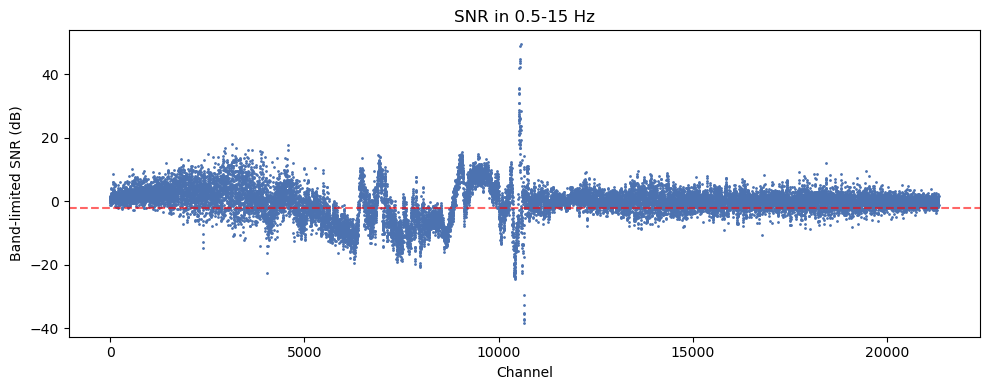

In [12]:
# --- BAND-LIMITED SNR VIA rFFT (NumPy-only) ---
# assumes you already have: sig (N x C), noi (N x C), fs, eps

# 1) frecuency band
fmin, fmax = 0.5, 15   # Hz 
#n samples and channels
N, C = sig.shape

# 2) window to reduce leakage (same window for sig/noi; scaling cancels in SNR)
win = np.hanning(N).reshape(-1, 1)
sig_w = sig * win
noi_w = noi * win

# 3) real FFT along time axis, the result shoul be fftvaklues, nof channels
Xs = np.fft.rfft(sig_w, axis=0)
Xn = np.fft.rfft(noi_w, axis=0)
freqs = np.fft.rfftfreq(N, d=1.0/fs)

# 4) one-sided weight for rFFT (double interior bins)
w_spec = np.ones_like(freqs)
if N % 2 == 0:
    # even-length: bins [1:-1] doubled (exclude DC and Nyquist)
    w_spec[1:-1] = 2.0
else:
    # odd-length: bins [1:] doubled (exclude only DC)
    w_spec[1:] = 2.0

# 5) band mask
mask = (freqs >= fmin) & (freqs <= fmax)

# 6) band power via Parseval (mean power = (1/N^2) * sum |X|^2_two-sided)
#    rFFT gives one-sided; use w_spec to reconstruct two-sided sum
P_sig_band = (w_spec[mask, None] * (np.abs(Xs[mask, :])**2)).sum(axis=0) / (N**2)
P_noi_band = (w_spec[mask, None] * (np.abs(Xn[mask, :])**2)).sum(axis=0) / (N**2) 

rms_sig_band = np.sqrt(P_sig_band)
rms_noi_band = np.sqrt(P_noi_band)
SNR_dB_band  = 20.0 * np.log10(rms_sig_band / rms_noi_band)

print(f"Band [{fmin:.2f}, {fmax:.2f}] Hz  →  median SNR = {np.median(SNR_dB_band):.2f} dB")

# quick looks
plt.figure(figsize=(10,4))
plt.plot(SNR_dB_band, '.', ms=2)
#plt.ylim(-20,1)
plt.axhline(-2, ls='--', alpha=0.6, color='r')
plt.xlabel("Channel"); plt.ylabel("Band-limited SNR (dB)")
plt.title(f"SNR in {fmin}-{fmax} Hz"); plt.tight_layout(); plt.show()


In [13]:
th_db = -2  # e.g., 1 dB

# SNR_dB, rms_sig, rms_noi, sig, noi already computed above; shapes: (n_channels,) and (win_len, n_channels)

# 1) boolean mask + indices
good_mask = SNR_dB_band > th_db
good_idx  = np.flatnonzero(good_mask)
print(f"{good_mask.sum()} channels pass {th_db} dB")

# 2) DataFrame with per-channel info
df_2 = pd.DataFrame({
    "channel":    np.arange(SNR_dB.size, dtype=int),
    "snr_db":     SNR_dB,
    "rms_signal": rms_sig_band,
    "rms_noise":  rms_noi_band,
    "pass":       good_mask
})

15575 channels pass -2 dB


In [15]:
df_2

,channel,snr_db,rms_signal,rms_noise,pass
0,0,1.976748,9.891750,11.279402,True
1,1,-0.237054,9.780652,9.625076,True
2,2,2.642588,10.526790,8.951346,True
3,3,-0.679109,10.796559,10.291183,True
4,4,10.994458,9.690267,9.803889,True
...,...,...,...,...,...
21321,21321,1.638109,8.669708,9.803889,True
21322,21322,-4.046142,10.418028,10.291183,True
21323,21323,4.067172,8.768000,8.951346,True
21324,21324,-0.777627,11.550641,9.625076,True


### Plot the filtered data to determine the appropriate time window for the analysis


In [16]:
# Sampling setup
dt   = 1/ fs # 50 Hz sampling → 0.02 s
print(fs)
tmax = 100 #30

#unnecesary step for keep it for now
window_len = int(tmax / dt) 

# Start times (in seconds), depend on each quake
small_start_time = 23 #53 
big_start_time   =  0 #13
noise_start_time = 0.0
# Cut from das_full_small
i_start_small = int(small_start_time / dt)
das_full_small = das_full_small[i_start_small : i_start_small + window_len, :]

# Cut from das_full_big
i_start_big = int(big_start_time / dt)

das_full_big = das_full_big[i_start_big : i_start_big + window_len, :]

# Cut from noise_win
i_start_noise = int(noise_start_time / dt)
noise_win = noise_win[i_start_noise : i_start_noise + window_len, :]

#filtering data high pass

#b,a = butter(2,1,'high',fs=1/dt)
b, a = butter(2, [1, 10], btype='bandpass', fs=1/dt)
full_bigfil  = filtfilt(b,a,das_full_big,axis=0)
full_smallfil= filtfilt(b,a,das_full_small,axis=0)
full_noise   = filtfilt(b,a,noise_win, axis=0)

print(full_bigfil.shape)
print(noise_win.shape)
print(full_smallfil.shape)
print(i_start_big)

50.0
(5000, 21326)
(3000, 21326)
(4707, 21326)
0


In [17]:
full_smallfil.shape

(4707, 21326)

In [18]:
x_noise = np.linspace(0, dx * full_noise.shape[1], full_noise.shape[1])
x_full_small = np.linspace(0, dx * full_smallfil.shape[1], das_full_small.shape[1])
x_full_big = np.linspace(0, dx * full_bigfil.shape[1], das_full_big.shape[1])

t_noise = np.linspace(0,dt*full_noise.shape[0],full_noise.shape[0])
t_big = np.linspace(0,dt*full_bigfil.shape[0],full_bigfil.shape[0])
t_small = np.linspace(0,dt*full_smallfil.shape[0],full_smallfil.shape[0])

# Plot filter data

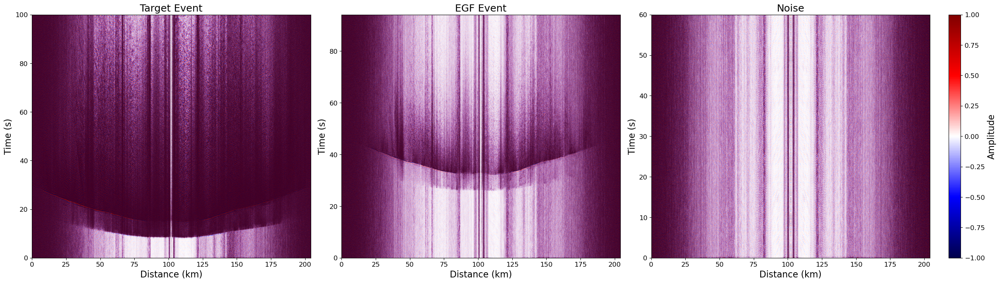

In [19]:
# Parameters
VMAX = 1.0        # use the largest scale across datasets
CMAP = "seismic"

LABEL_SIZE = 16
TITLE_SIZE = 18
TICK_SIZE  = 12

# Extents: [xmin(km), xmax(km), ymin(s), ymax(s)]
extent_big   = [x_full_big[0]/1000,   x_full_big[-1]/1000,   0, t_big[-1]]
extent_small = [x_full_small[0]/1000, x_full_small[-1]/1000, 0, t_small[-1]]
extent_noise = [x_noise[0]/1000,      x_noise[-1]/1000,      0, t_noise[-1]]

fig, axs = plt.subplots(1, 3, figsize=(25, 7), constrained_layout=True)

# --- Big Event ---
im0 = axs[0].imshow(full_bigfil, aspect="auto", cmap=CMAP,
                    vmin=-VMAX, vmax=VMAX, origin="lower", extent=extent_big)
axs[0].set_title("Target Event", fontsize=TITLE_SIZE)

# --- Small Event ---
axs[1].imshow(full_smallfil, aspect="auto", cmap=CMAP,
              vmin=-VMAX, vmax=VMAX, origin="lower", extent=extent_small)
axs[1].set_title("EGF Event", fontsize=TITLE_SIZE)

# --- Noise ---
axs[2].imshow(full_noise, aspect="auto", cmap=CMAP,
              vmin=-VMAX, vmax=VMAX, origin="lower", extent=extent_noise)
axs[2].set_title("Noise", fontsize=TITLE_SIZE)

# --- Axis formatting ---
for ax in axs:
    ax.set_xlabel("Distance (km)", fontsize=LABEL_SIZE)
    ax.set_ylabel("Time (s)", fontsize=LABEL_SIZE)
    ax.tick_params(labelsize=TICK_SIZE)

# --- Shared colorbar ---
cbar = fig.colorbar(im0, ax=axs, orientation="vertical",
                    fraction=0.025, pad=0.02)
cbar.ax.tick_params(labelsize=TICK_SIZE)
cbar.set_label("Strain rate", fontsize=LABEL_SIZE)

# Save (optional)
fig.savefig("bigsmallnoise.png", dpi=300, bbox_inches="tight")
plt.show()


### Computing NMO with the cable coords

[876 876 876 ... 764 764 765]


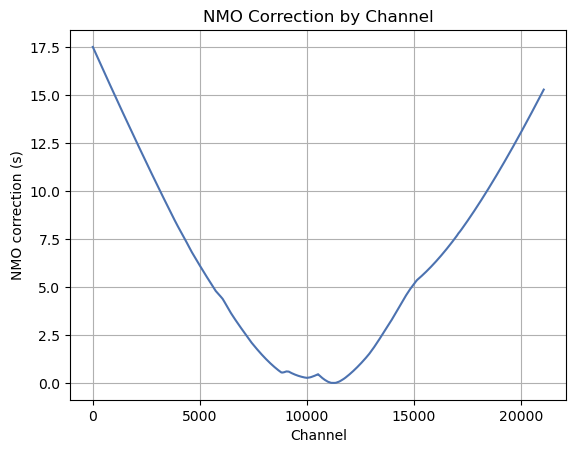

In [23]:
#  Load cable coordinates from CSV ---
df = pd.read_csv("terra-kkfln_cablecoord-newversion.csv")  # or your filepath
df.shape

# Convert (lon, lat) to meters using UTM ---
# Alaska is in UTM Zone 5N → EPSG:32605

transformer = Transformer.from_crs("EPSG:4326", "EPSG:32605", always_xy=True)

x_das, y_das = transformer.transform(df['lon'].values, df['lat'].values)
z_das = np.zeros_like(x_das)  # assume cable is at surface (z = 0)

#Define the event location (source) - big quake
event_lon = -151.538
event_lat = 59.425
event_depth_km = 43.3
v = 3500  # velocity in m/s
# Convert source to meters
x0, y0 = transformer.transform(event_lon, event_lat)
z0 = -event_depth_km * 1000  # positive depth → negative elevation

# --- 4. Compute travel time to each channel ---
xoffsets = x_das - x0
yoffsets = y_das - y0
zoffsets = z_das - z0

# Euclidean distance in 3D → divide by velocity to get time
travel_times = np.sqrt((xoffsets / v)**2 + (yoffsets / v)**2 + (zoffsets / v)**2)
moveout_times = travel_times 

# .Compute relative NMO correction ---
nmo_correction = travel_times - np.min(travel_times)
nmo_samples    = nmo_correction//dt
nmo_samples    = nmo_samples.astype(int)
print(nmo_samples)

# --- 6. Save or append to dataframe ---
df['NMO_terra-kkfln'] = nmo_correction

# Optional: save to CSV
df.to_csv("NMO_terra-kkfln.csv", index=False)

plt.plot(df['channel'], df['NMO_terra-kkfln'])
plt.xlabel("Channel")
plt.ylabel("NMO correction (s)")
plt.title("NMO Correction by Channel")
plt.grid(True)
plt.show()

#plt.figure()

#plt.plot(df['channel'], nmo_samples)



In [21]:
df

,lon,lat,index,value,channel,NMO_terra-kkfln
0,-153.288841,59.553343,10662.0,NaN,0,17.526515
1,-153.288672,59.553344,10661.0,NaN,1,17.524032
2,-153.288502,59.553346,10660.0,NaN,2,17.521549
3,-153.288333,59.553347,10659.0,NaN,3,17.519066
4,-153.288164,59.553348,10658.0,NaN,4,17.516582
...,...,...,...,...,...,...
21053,-151.745428,60.240818,10658.0,NaN,21053,15.291963
21054,-151.745363,60.240897,10659.0,NaN,21054,15.294118
21055,-151.745298,60.240977,10660.0,NaN,21055,15.296274
21056,-151.745234,60.241057,10661.0,NaN,21056,15.298430


In [24]:
#Also innecsary step, just for visualization

# 1) window length
t_windowed = np.arange(window_len) * dt  # time of x 0→tmax

# 2) Same length and data moveout_times 
n_drop = full_smallfil.shape[1] - len(moveout_times)

full_bigfil   = full_bigfil[:,   n_drop:]
full_smallfil = full_smallfil[:, n_drop:]
full_noise    = full_noise[:,    n_drop:]

das_full_big  = das_full_big[:,   n_drop:]
das_full_small= das_full_small[:, n_drop:]
noise_win_cut = noise_win[:, n_drop:]


In [25]:
len(moveout_times)

21058

(21058,)
(5000, 21058)


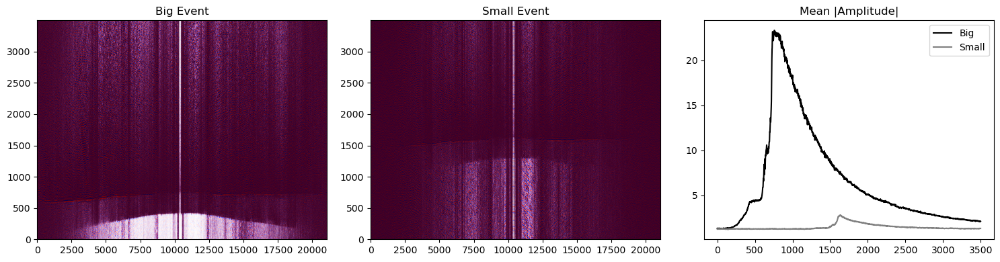

In [26]:
# Correct NMO for entire trace matrix

print(np.shape(nmo_samples))
print(np.shape(full_bigfil))

big_dataf   = np.zeros((3500,np.shape(full_bigfil)[1]))
small_dataf = np.zeros((3500,np.shape(full_smallfil)[1]))
raw_big     = np.zeros((3500,np.shape(das_full_big)[1]))
raw_small     = np.zeros((3500,np.shape(das_full_small)[1]))

for i in range(len(nmo_samples)):
    big_dataf[:,i]   = full_bigfil[nmo_samples[i]:nmo_samples[i]+3500,i] # filtered
    small_dataf[:,i] = full_smallfil[nmo_samples[i]:nmo_samples[i]+3500,i] 
    raw_big[:,i]     = das_full_big[nmo_samples[i]:nmo_samples[i]+3500,i] 
    raw_small[:,i]   = das_full_small[nmo_samples[i]:nmo_samples[i]+3500,i] 
#full_smallfil
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# First plot: big_dataf
axs[0].imshow(big_dataf, cmap='seismic', vmin=-0.8, vmax=0.8, origin='lower', aspect='auto')
axs[0].set_title("Big Event")

# Second plot: small_dataf
axs[1].imshow(small_dataf, cmap='seismic', vmin=-0.05, vmax=0.05, origin='lower', aspect='auto')
axs[1].set_title("Small Event")

# Third plot: mean absolute amplitude
axs[2].plot(np.nanmean(np.abs(big_dataf), axis=1), label="Big", color='black')
axs[2].plot(np.nanmean(np.abs(small_dataf), axis=1), label="Small", color='gray')
axs[2].set_title("Mean |Amplitude|")
axs[2].legend()

plt.tight_layout()
plt.show()


In [27]:
# Find index of max absolute amplitude over time (axis=0 is time)
big_idx = np.argmax(np.nanmean(np.abs(big_dataf), axis=1))
small_idx = np.argmax(np.nanmean(np.abs(small_dataf), axis=1))

In [28]:
pre_sec  = 5  # 2  # sec beforer arrival
post_sec = 10 # 10  # sec after arrival
#in samples
pre_samples  = int(pre_sec / dt)
post_samples = int(post_sec/ dt)
# index
bstart_idx = max(big_idx - pre_samples, 0)
bend_idx   = min(big_idx + post_samples, big_dataf.shape[0])

sstart_idx = max(small_idx - pre_samples, 0)
send_idx   = min(small_idx + post_samples, small_dataf.shape[0])

#cuts
big_cut   = big_dataf[bstart_idx:bend_idx, :]
small_cut = small_dataf[sstart_idx:send_idx, :]

raw_big_cut   = raw_big[bstart_idx:bend_idx, :]
raw_small_cut = raw_small[sstart_idx:send_idx, :]
noise_raw      = noise_win_cut[0:len(raw_small_cut),:]

### Correcting or aligning DAS data after moveout

In [ ]:
# Plot event cut filter and rwa
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(big_cut, cmap='seismic', vmin=-0.8, vmax=0.8, origin='lower', aspect='auto')
plt.title("NMO Big Cut - filter")

plt.subplot(2, 2, 2)
plt.imshow(small_cut, cmap='seismic', vmin=-0.05, vmax=0.05, origin='lower', aspect='auto')
plt.title("NMO Small Cut - filter")

plt.subplot(2, 2, 3)
plt.imshow(raw_big_cut, cmap='seismic', vmin=-0.8, vmax=0.8, origin='lower', aspect='auto')
plt.title("Raw Big Cut")

plt.subplot(2, 2, 4)
plt.imshow(raw_small_cut, cmap='seismic', vmin=-0.05, vmax=0.05, origin='lower', aspect='auto')
plt.title("Raw Small Cut")

plt.tight_layout()
plt.show()


### Calculate the spectral ratio

Here good practices, should be:

**1.- rest the mean do the data (detrend)

**2.- no just do ft_b/ft_s **

**3.- calculate $ft_b*ft_s*/abs(ft_s)**2$

**4.- maybe a water level thing **

# Multitaper try

In [29]:
#just detreining the data here, 
def hanning_detrend(x, fmin=1, fmax=10, dt=0.02):
    '''
    x = DAS data
    data_ready = Das data ready to work with fft
    '''
    npts, n_chan   = x.shape
    hann   = np.hanning(npts)
    
    b, a = butter(2, [fmin, fmax], btype='bandpass', fs=1/dt)
    data_ready = np.empty_like(x)

    for i in range(n_chan):
        trace       = x[:,i]
        trace_detre = signal.detrend(trace)  # just resting the mean 
        #trace_tap   = trace_detre * hann
        #trace_filt  = filtfilt(b, a, trace_tap) no need for filter
        data_ready[:, i] = trace_detre 
        
    return data_ready

In [30]:
# Apply  Hanning and detrend
big_detrend   = hanning_detrend(raw_big_cut, fmin=1, fmax=10, dt=0.02)#, mode='hanning')
small_detrend = hanning_detrend(raw_small_cut, fmin=1, fmax=10, dt=0.02)#, mode='hanning')
noise_detrend = hanning_detrend(noise_raw, fmin=1, fmax=10, dt=0.02)#, mode='hanning')

In [31]:
def multi_mtcross(x_big, x_small, x_noise,dt, wl=0.001):
    """
    Apply multitaper cross-spectral analysis to each channel pair using MTCross.
    
    Parameters:
        x_big (ndarray): 2D array (time × channels), typically the larger event
        x_small (ndarray): 2D array (time × channels), smaller event
        dt (float): Sampling interval in seconds
        wl (float): Water level for stabilization in inversion (default: 0.001)

    Returns:
        stf_matrix (ndarray): STF for each channel (time × channels)
        ratio_matrix (ndarray): Spectral ratio for each channel (frequency × channels)
        freq (ndarray): Frequency vector in Hz
        t_stf (ndarray): Time vector for STF
    """
    assert x_big.shape == x_small.shape, "Input arrays must have same shape"
    
    nw = 4.0
    kspec = 6
    npts, n_chan = x_big.shape

    stf_list         = []
    ratio_list       = []
    mt_small_list    = []
    mt_big_list      = []
    mt_noise_list    = []

    for j in range(n_chan):
        mt_big   = MTSpec(x_big[:, j], nw, kspec, dt)
        mt_small = MTSpec(x_small[:, j], nw, kspec, dt)
        mt_noise = MTSpec(x_noise[:, j], nw, kspec, dt)
        
        mt_big_list.append(mt_big)
        mt_small_list.append(mt_small)
        mt_noise_list.append(mt_noise)

        # Compute spectral ratio
        sratio = np.sqrt(mt_big.spec[:, 0] / mt_small.spec[:, 0])
        ratio_list.append(sratio)

        # Compute STF from cross-spectrum
        mt_cross = MTCross(mt_big, mt_small, wl=wl)
        _, _, dconv = mt_cross.mt_corr()
        stf = dconv[:, 0]  # take real STF
        stf_list.append(stf)

    ratio_matrix = np.array(ratio_list).T  # shape: (freq, chan)
    stf_matrix = np.array(stf_list).T      # shape: (time, chan)
    freq = mt_big.freq
    t_stf = np.arange(-((stf_matrix.shape[0]-1)//2), (stf_matrix.shape[0]//2)+1) * dt

    return stf_matrix, ratio_matrix, freq, t_stf, mt_big_list, mt_small_list, mt_noise_list


In [32]:
stf_matrix,ratio_matrix,freq,t_stf,mt_big_list,mt_small_list, mt_noise_list= multi_mtcross(big_detrend,small_detrend,noise_detrend,dt, wl=0.001 )

In [33]:
# Construct spectral matrices from MTSpec lists
mt_big_matrix   = np.array([mt.spec[:, 0] for mt in mt_big_list]).T   # shape: (n_freq, n_chan)
mt_small_matrix = np.array([mt.spec[:, 0] for mt in mt_small_list]).T # shape: (n_freq, n_chan)
mt_noise_matrix = np.array([mt.spec[:, 0] for mt in mt_noise_list]).T 

In [34]:
p_small = np.abs(mt_small_matrix)**2
epsilon = 0  # small value to avoid division by zero
Ratio = mt_big_matrix * np.conj(mt_small_matrix) / (p_small + epsilon)
ratio_amp = np.abs(Ratio)
pos_idx = np.squeeze(freq) > 0  #  1D
ratio_pos = ratio_amp[pos_idx, :]  # keep only positive frequencies
# Average over channels
mag_big   = np.mean(np.abs(mt_big_matrix), axis=1)
mag_small = np.mean(np.abs(mt_small_matrix), axis=1)
mag_ratio = np.mean(ratio_amp, axis=1)
mag_noise = np.mean(abs(mt_noise_matrix),axis=1)

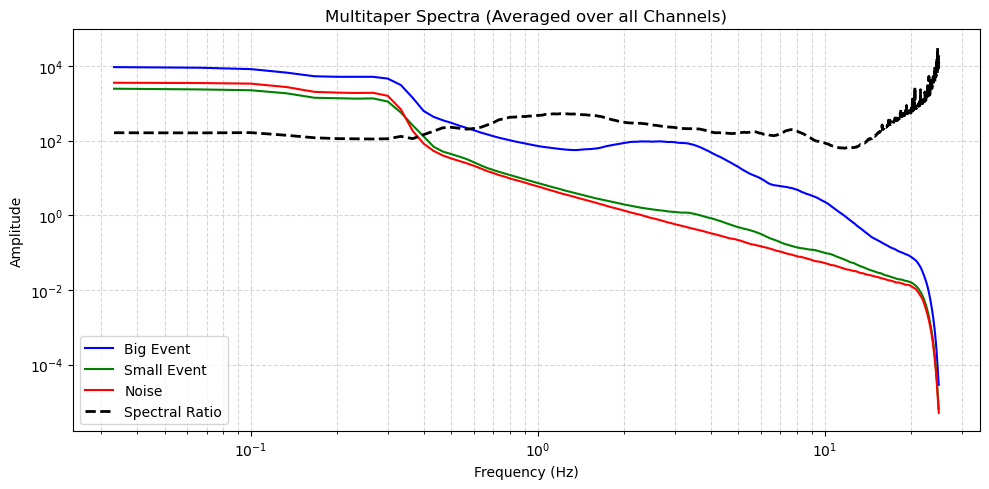

In [35]:
# 
f_pos = freq[pos_idx]
mag_big_pos = mag_big[pos_idx]
mag_small_pos = mag_small[pos_idx]
mag_ratio_pos = mag_ratio[pos_idx]
mag_noise_pos = mag_noise[pos_idx]

#ploting w noise 
plt.figure(figsize=(10, 5))
plt.loglog(f_pos, mag_big_pos, label='Big Event', color='blue')
plt.loglog(f_pos, mag_small_pos, label='Small Event', color='green')
plt.loglog(f_pos, mag_noise_pos, label='Noise', color='red')
plt.loglog(f_pos, mag_ratio_pos, label='Spectral Ratio', color='black', linestyle='--', linewidth=2)

plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")

plt.title("Multitaper Spectra (Averaged over all Channels)")
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig('spectumfrequencydomain_10_multitaper', dpi = 300)
plt.show()


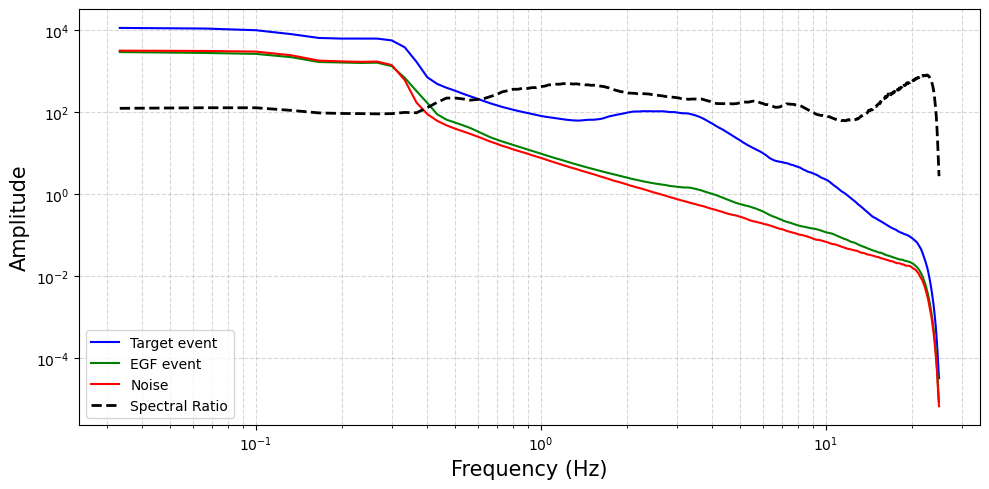

In [36]:
n_mt = mt_big_matrix.shape[1]
n_drop_check = good_mask.size - n_mt
assert n_drop_check == n_drop

good_mask_mt = good_mask[n_drop:n_drop + n_mt]  # ahora (21058,)


mt_big_g   = mt_big_matrix[:,   good_mask_mt]   # or [:, good_idx]
mt_small_g = mt_small_matrix[:, good_mask_mt]
mt_noise_g = mt_noise_matrix[:, good_mask_mt]

# 2) Spectral ratio using only good channels
eps = 1e-12
p_small_g   = np.abs(mt_small_g)**2
Ratio_g     = mt_big_g * np.conj(mt_small_g) / (p_small_g + eps)
ratio_amp_g = np.abs(Ratio_g)

# 3) Average over channels (axis=1)
mag_big_g   = np.nanmean(np.abs(mt_big_g),   axis=1)
mag_small_g = np.nanmean(np.abs(mt_small_g), axis=1)
mag_ratio_g = np.nanmean(ratio_amp_g,        axis=1)
mag_noise_g = np.nanmean(np.abs(mt_noise_g), axis=1)

# 4) Keep positive freqs & plot
freq1d = np.squeeze(freq)
pos    = freq1d > 0
f_pos  = freq1d[pos]

plt.figure(figsize=(10,5))
plt.loglog(f_pos, mag_big_g[pos],   label='Target event',   color='blue')
plt.loglog(f_pos, mag_small_g[pos], label='EGF event', color='green')
plt.loglog(f_pos, mag_noise_g[pos], label='Noise', color='red')
plt.loglog(f_pos, mag_ratio_g[pos], label='Spectral Ratio',   color='black', linestyle='--', linewidth=2)
plt.xlabel("Frequency (Hz)",fontsize =15)
plt.ylabel("Amplitude",fontsize =15)
#plt.title("Multitaper Spectra — averaged over Good channels")
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.savefig("spectrum_good_channels.png", dpi=200)
plt.show()


In [37]:
assert mt_big_matrix.shape[1] == good_mask_mt.size

# Come back to t
get the source time fuction plot
compare with the previous version
calculate corner frequency
calculate stress drop


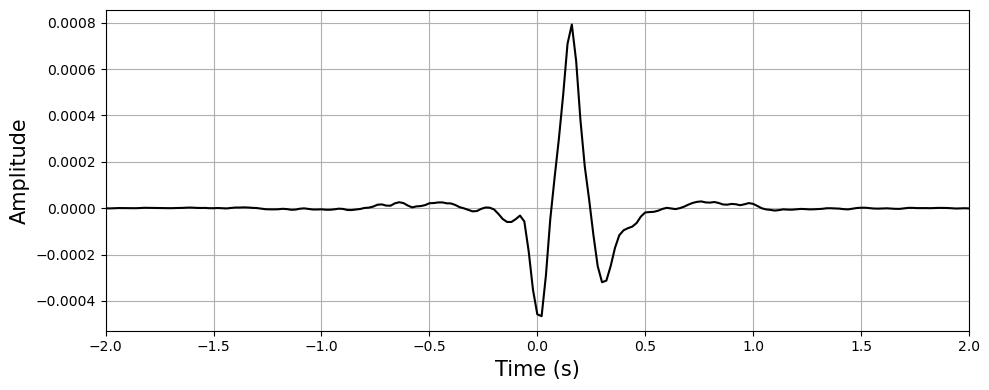

In [39]:
stf_avg = np.mean(stf_matrix, axis=1)

plt.figure(figsize=(10, 4))
plt.plot(t_stf, stf_avg, color='black')
#plt.plot(t_stf, stf_avg[::-1], color='black')
plt.xlabel("Time (s)", fontsize=15)
plt.ylabel("Amplitude",fontsize=15)
plt.xlim(-2,2)
#plt.ylim(-0.00050,0.00090)
#plt.title("Average Source Time Function (STF) with multitaper")
plt.grid(True)
plt.tight_layout()
#plt.savefig("stf.png", dpi=200)
plt.show()

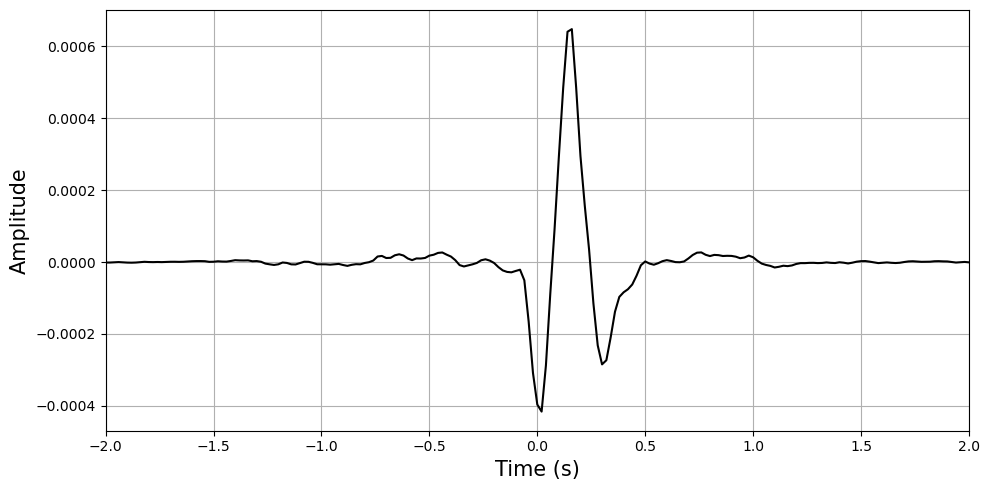

In [40]:
stf_good = stf_matrix[:, good_mask_mt]  
# plot
stf_avg_g = np.mean(stf_good, axis=1)
plt.figure(figsize=(10, 5))
plt.plot(t_stf, stf_avg_g, color='black')
plt.xlabel("Time (s)",fontsize=15)
plt.ylabel("Amplitude",fontsize=15)
plt.xlim(-2, 2)
#plt.ylim(-0.00050,0.00090)
#plt.title("Average Source Time Function (good channels)")
plt.grid(True)
plt.tight_layout()
plt.savefig("stf.png", dpi=200)
plt.show()

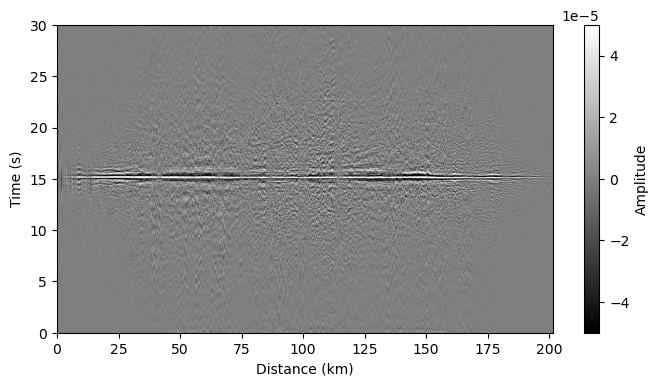

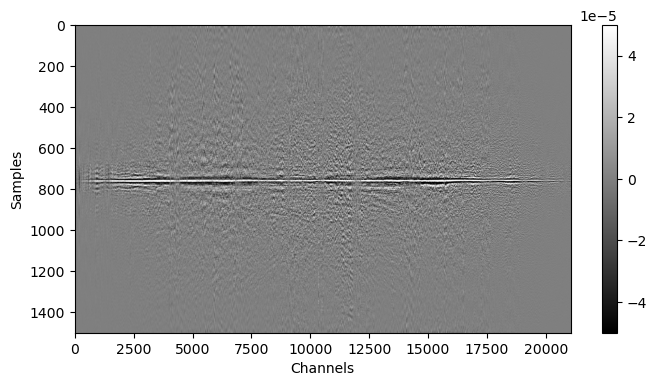

In [41]:
# Example parameters
dt = 1/fs        # time step in seconds (adjust to your data)
dx = dx  # channel spacing in meters (adjust to your data)

n_samples, n_channels = stf_matrix.shape

# Build axis extents
time_max = n_samples * dt
dist_max = n_channels * dx / 1000.0   # convert m to km

extent = [0, dist_max, 0, time_max]   # [xmin, xmax, ymin, ymax]

# Plot
fig, ax = plt.subplots(figsize=(8, 4))
c = ax.imshow(np.real(stf_matrix),
              aspect='auto',
              cmap='gray',
              vmin=-5e-5, vmax=5e-5,
              origin='lower',          # so time increases upward
              extent=extent)

plt.colorbar(c, ax=ax, label="Amplitude")
ax.set_xlabel("Distance (km)")
ax.set_ylabel("Time (s)")

# Optional: limit time window
# ax.set_ylim(0, 5)   # first 5 seconds, for example

plt.show()


fig, ax = plt.subplots(figsize=(8,4))
c=plt.imshow(np.real(stf_matrix),aspect='auto',cmap='gray',vmin=-5e-5,vmax=5e-5)
plt.colorbar(c)
#plt.ylim(700,850)
plt.xlabel('Channels')
plt.ylabel('Samples')
#plt.savefig('real-ratio_time.png')
plt.show()

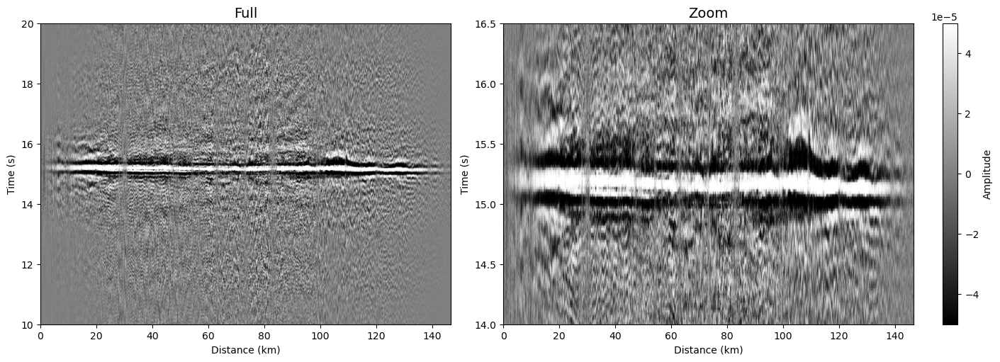

In [42]:
stf_g = np.real(stf_matrix[:, good_mask_mt])  # (n_samples, n_good)

# Example parameters
dt = 1/fs        # time step in seconds (adjust to your data)
dx = dx  # channel spacing in meters (adjust to your data)

n_samples, n_channels = stf_g.shape
time_max = n_samples * dt
dist_max = n_channels * dx / 1000.0   # en km

extent = [0, dist_max, 0, time_max]

# Crear figura con 2 paneles
fig, axs = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

# --- Panel 1: Vista completa ---
im = axs[0].imshow(np.real(stf_matrix),
                   aspect='auto',
                   cmap='gray',
                   vmin=-5e-5, vmax=5e-5,
                   origin='lower',
                   extent=extent)
axs[0].set_ylim(10, 20)    # tiempo en segundos
axs[0].set_title("Full", fontsize=14)
axs[0].set_xlabel("Distance (km)")
axs[0].set_ylabel("Time (s)")

# --- Panel 2: Zoom ---
axs[1].imshow(np.real(stf_matrix),
              aspect='auto',
              cmap='gray',
              vmin=-5e-5, vmax=5e-5,
              origin='lower',
              extent=extent)

# Aquí defines tu zona de zoom:
#axs[1].set_xlim(5, 10)   # distancia en km
axs[1].set_ylim(14, 16.5)    # tiempo en segundos

axs[1].set_title("Zoom", fontsize=14)
axs[1].set_xlabel("Distance (km)")
axs[1].set_ylabel("Time (s)")

# Colorbar compartido
cbar = fig.colorbar(im, ax=axs, orientation="vertical", fraction=0.025, pad=0.02)
cbar.set_label("Amplitude")

plt.savefig('stf_real-zoom.png',dpi=200)
plt.show()



In [43]:
# Flatten frequency vector
#freq = freq.flatten()
# Create valid index mask
pos_idx = freq > 0
# Now this will wo
f_pos = freq[pos_idx]

# PLOTTING AVERAGING BY CHANNELS

In [44]:
#  de 0 a f_ref (0.2 Hz)
n_channels = big_detrend.shape[1]
group_size = 500
n_groups = int(np.ceil(n_channels / group_size))
# 
f_ref_min = 0.8
f_ref_max = 1.8
Y_ref = 2  # log10(100) = 2  corresponds to 100 in dB space

In [45]:
mask = (f_pos > f_ref_min) & (f_pos <= f_ref_max)
cmap = cm.get_cmap('viridis', n_groups)  # or 'plasma', 'coolwarm', etc.
colors = [cmap(i) for i in range(n_groups)]

/tmp/ipykernel_1638565/2490230304.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', n_groups)  # or 'plasma', 'coolwarm', etc.


/tmp/ipykernel_1638565/2547860100.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap   = cm.get_cmap('viridis', n_groups)


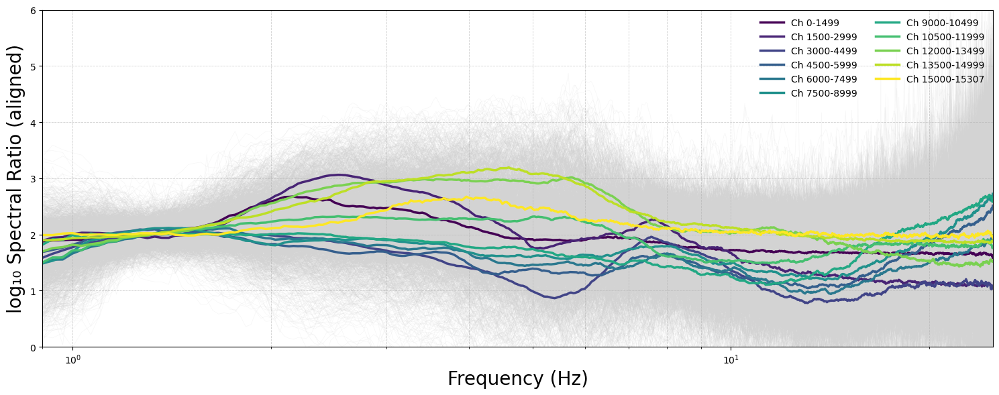

In [46]:
# 0) Filter to GOOD channels *once*, before the loop
ratio_pos_g = ratio_pos[:, good_mask_mt]        # shape: (n_fpos, n_good)
assert ratio_pos_g.shape[0] == f_pos.size

# 1) Recompute sizes & colors for the reduced set
n_channels = ratio_pos_g.shape[1]
group_size = 1500
n_groups   = int(np.ceil(n_channels / group_size))

from matplotlib import cm
cmap   = cm.get_cmap('viridis', n_groups)
colors = [cmap(i) for i in range(n_groups)]

# 2) Plot using the reduced matrix
fig = plt.figure(figsize=(15, 6))
skip_groups = []
for g in range(n_groups):
    if g in skip_groups:
        continue

    ch0 = g * group_size
    ch1 = min((g + 1) * group_size, n_channels)

    group = ratio_pos_g[:, ch0:ch1]             # slice from the reduced set
    group = np.where(group <= 0, np.nan, group)
    group_log = np.log10(group)

    group_med_curve = np.nanmedian(group_log, axis=1)
    v_ref = np.nanmedian(group_med_curve[mask])
    if not np.isfinite(v_ref):
        print(f"Skipping group {g} due to invalid v_ref")
        continue

    shifted = group_med_curve - v_ref + Y_ref

    # OPTIONAL: draw a subsample of individual channels to avoid huge overplotting
    step = max(1, (ch1 - ch0) // 200)           # ≤~200 lines
    for j in range(0, ch1 - ch0, step):
        ch_curve = group[:, j]
        ch_curve = np.where(ch_curve <= 0, np.nan, ch_curve)
        ch_log   = np.log10(ch_curve)
        ch_vref  = np.nanmedian(ch_log[mask])
        if not np.isfinite(ch_vref):
            continue
        ch_shifted = ch_log - ch_vref + Y_ref
        plt.plot(f_pos, ch_shifted, color='lightgray', alpha=0.2, linewidth=0.5, zorder=1)

    plt.plot(f_pos, shifted, color=colors[g], linewidth=2.5,
             label=f"Ch {ch0}-{ch1-1}", zorder=2)

plt.xscale("log"); plt.yscale("linear")
plt.xlabel("Frequency (Hz)", fontsize =20)
plt.ylabel("log₁₀ Spectral Ratio (aligned)",fontsize =20)
#plt.title(f"Spectral Ratio (good channels; median-aligned in {f_ref_min}–{f_ref_max} Hz)")
plt.grid(which="both", linestyle="--", linewidth=0.6, alpha=0.6)
plt.xlim(0.9, 25); plt.ylim(0, 6)
plt.legend(loc='upper right', ncol=2, frameon=False, handlelength=2.5)
plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
plt.tight_layout();
plt.savefig('spectralratiobycolor.png',dpi=200)
plt.show()


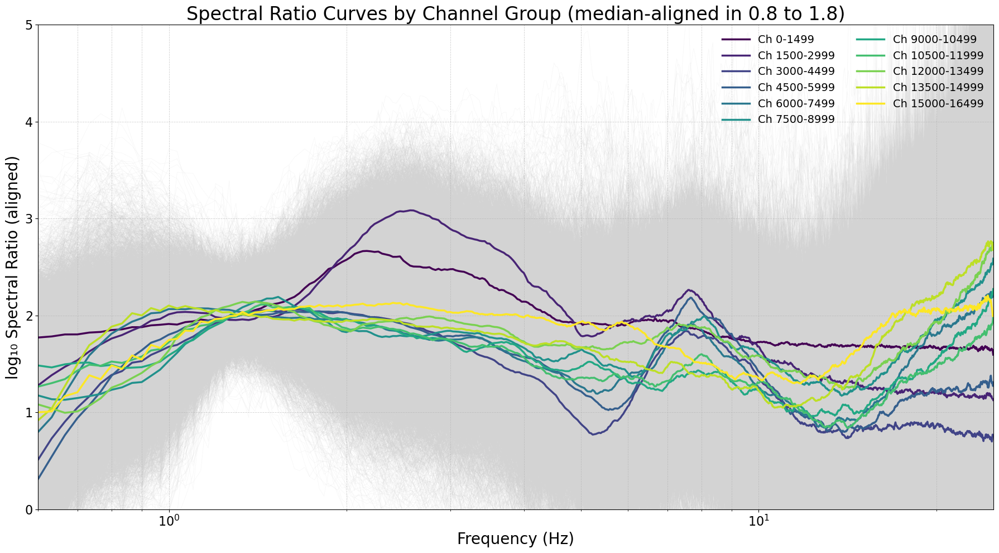

In [47]:
n_channels = ratio_pos.shape[1]
# --- Plot settings ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'axes.titlesize': 24,
    'axes.labelsize': 20,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
    'figure.titlesize': 26,
    'lines.linewidth': 3,
})
#skip_groups = [0,1,19,20]  
skip_groups = []

fig = plt.figure(figsize=(18, 10))

for g in range(n_groups):
    if g in skip_groups:
        continue
        
    ch0 = g * group_size
    ch1 = min((g + 1) * group_size, n_channels)
    group = ratio_pos[:, ch0:ch1]

    # Avoid division/log errors
    group = ratio_pos[:, ch0:ch1]
    group = np.where(group <= 0, np.nan, group)
    group_log = np.log10(group)

    # Compute group median curve and its reference value
    group_med_curve = np.nanmedian(group_log, axis=1)
    v_ref = np.nanmedian(group_med_curve[mask])

    if not np.isfinite(v_ref):
        print(f"Skipping group {g} due to invalid v_ref")
        continue

    shifted = group_med_curve - v_ref + Y_ref
    #ratio_pos_g = ratio_pos[:, good_mask_mt] 
    # Optional: overlay gray lines for individual channels
    for ch in range(ch0, ch1):
        ch_curve = ratio_pos[:, ch]
        ch_curve = np.where(ch_curve <= 0, np.nan, ch_curve)
        ch_log = np.log10(ch_curve)
        ch_vref = np.nanmedian(ch_log[mask])

        if not np.isfinite(ch_vref):
            continue

        ch_shifted = ch_log - ch_vref + Y_ref
        plt.plot(f_pos, ch_shifted, color='lightgray', alpha=0.2, linewidth=0.5, zorder=1)

    # Plot the group median curve on top
    plt.plot(f_pos, shifted, color=colors[g], linewidth=2.5, label=f"Ch {ch0}-{ch1 - 1}", zorder=2)


plt.xscale("log")
plt.yscale("linear")
plt.xlabel("Frequency (Hz)")
plt.ylabel("log₁₀ Spectral Ratio (aligned)")
plt.title(f'Spectral Ratio Curves by Channel Group (median-aligned in {f_ref_min} to {f_ref_max})')
plt.grid(which="both", linestyle="--", linewidth=0.6, alpha=0.6)
plt.xlim(0.6, 25)
plt.ylim(0,5)
plt.legend(loc='upper right', ncol=2, frameon=False, handlelength=2.5)
plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True))

plt.tight_layout()
plt.savefig(f'spectral-ratio-log10-median-aligned.png', dpi=200)
plt.show()

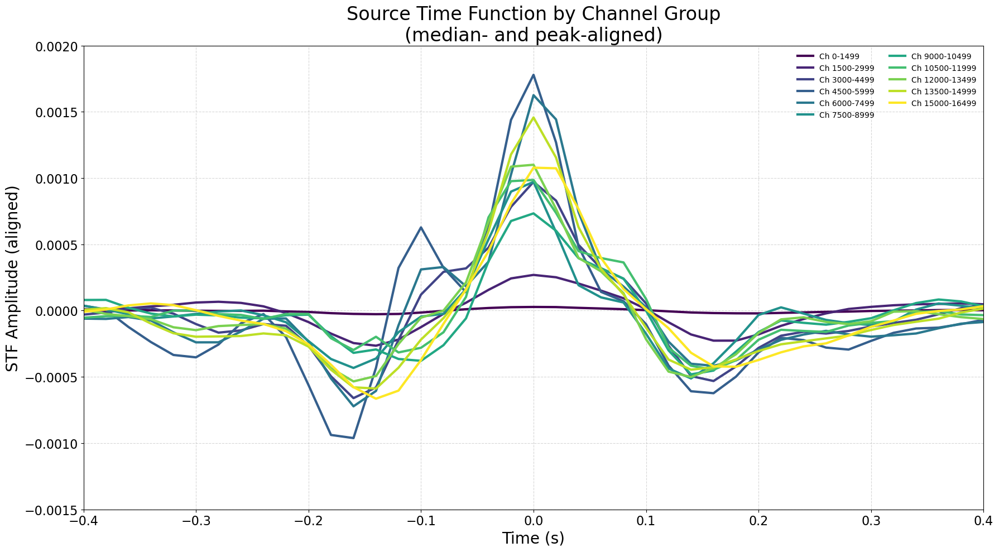

In [48]:
from matplotlib.ticker import ScalarFormatter

group_labels = [f"Ch {g*group_size}-{min((g+1)*group_size, n_channels)-1}" for g in range(n_groups)]
group_colors = [cmap(i) for i in range(n_groups)]
# --- Reference window for vertical alignment ---
t0, t1 = -0.8, 0.8
Y_ref_stf = 0.0
time_mask = (t_stf >= t0) & (t_stf <= t1)


# Index closest to t = 0 (target peak location)
zero_idx = np.argmin(np.abs(t_stf - 0.0))

# --- Plot settings ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'axes.titlesize': 24,
    'axes.labelsize': 20,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
    'figure.titlesize': 26,
    'lines.linewidth': 3,
})
#skip_groups = [0,1] 

fig = plt.figure(figsize=(18, 10))

for g in range(n_groups):
    if g in skip_groups:
        continue
    ch0 = g * group_size
    ch1 = min((g+1) * group_size, n_channels)
    group = stf_matrix[:, ch0:ch1]

    # Median trace across channels
    group_curve = np.median(group, axis=1)

    # Vertical alignment by subtracting median in reference window
    med_val = np.median(group_curve[time_mask])
    vertical_shift = Y_ref_stf - med_val
    shifted_curve = group_curve + vertical_shift

    # --- Time alignment: roll so that peak is at t=0 ---
    peak_idx = np.argmax(np.abs(shifted_curve))
    roll_amt = zero_idx - peak_idx
    rolled = np.roll(shifted_curve, roll_amt)

    # Optional: mask wraparound to NaN
    if roll_amt > 0:
        rolled[:roll_amt] = np.nan
    elif roll_amt < 0:
        rolled[roll_amt:] = np.nan

    # Plot
    plt.plot(t_stf, rolled, color=group_colors[g], label=group_labels[g])

# --- Final formatting ---
plt.xlabel("Time (s)")
plt.ylabel("STF Amplitude (aligned)")
plt.title("Source Time Function by Channel Group\n(median- and peak-aligned)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.xlim(-0.4, 0.4)
plt.ylim(-0.0015, 0.002)
plt.legend(ncol=2, fontsize=10, frameon=False)
plt.tight_layout()
plt.savefig("stf-aligned-median-and-peak.png", dpi=200)
plt.show()


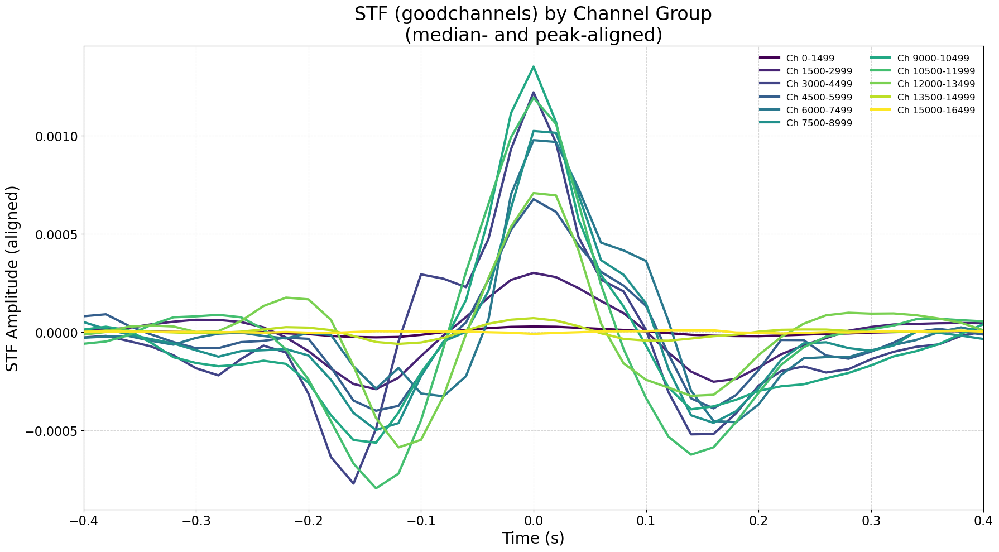

In [50]:
#good channels
from matplotlib.ticker import ScalarFormatter

group_labels = [f"Ch {g*group_size}-{min((g+1)*group_size, n_channels)-1}" for g in range(n_groups)]
group_colors = [cmap(i) for i in range(n_groups)]
# --- Reference window for vertical alignment ---
t0, t1 = -0.8, 0.8
Y_ref_stf = 0.0
time_mask = (t_stf >= t0) & (t_stf <= t1)


# Index closest to t = 0 (target peak location)
zero_idx = np.argmin(np.abs(t_stf - 0.0))

# --- Plot settings ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'axes.titlesize': 24,
    'axes.labelsize': 20,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
    'figure.titlesize': 26,
    'lines.linewidth': 3,
})
#skip_groups = [0,1] 

fig = plt.figure(figsize=(18, 10))

for g in range(n_groups):
    if g in skip_groups:
        continue
    ch0 = g * group_size
    ch1 = min((g+1) * group_size, n_channels)
    group = stf_g[:, ch0:ch1]

    # Median trace across channels
    group_curve = np.median(group, axis=1)

    # Vertical alignment by subtracting median in reference window
    med_val = np.median(group_curve[time_mask])
    vertical_shift = Y_ref_stf - med_val
    shifted_curve = group_curve + vertical_shift

    # --- Time alignment: roll so that peak is at t=0 ---
    peak_idx = np.argmax(np.abs(shifted_curve))
    roll_amt = zero_idx - peak_idx
    rolled = np.roll(shifted_curve, roll_amt)

    # Optional: mask wraparound to NaN
    if roll_amt > 0:
        rolled[:roll_amt] = np.nan
    elif roll_amt < 0:
        rolled[roll_amt:] = np.nan

    # Plot
    plt.plot(t_stf, rolled, color=group_colors[g], label=group_labels[g])

# --- Final formatting ---
plt.xlabel("Time (s)")
plt.ylabel("STF Amplitude (aligned)")
plt.title("STF (goodchannels) by Channel Group\n(median- and peak-aligned)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.xlim(-0.4, 0.4)
#plt.ylim(-0.0015, 0.002)
plt.legend(ncol=2, fontsize=12, frameon=False)
plt.tight_layout()
plt.savefig("stf-aligned-median-and-peak.png", dpi=200)
plt.show()


In [54]:
#distance better
from pyproj import Geod
from matplotlib.colors import Normalize

In [55]:
# Mapping originals -> post-drop (MT) space
n_mt   = x_das.shape[0]                 # 21058
start  = n_drop                         # first original ID present post-drop
end    = start + n_mt

# good_orig_idx: original channel IDs that passed (e.g., df_2.loc[df_2.pass, 'channel'])
good_orig_idx = np.sort(good_orig_idx)

# keep only goods that exist post-drop, then map to MT indices
valid        = (good_orig_idx >= start) & (good_orig_idx < end)
good_orig_idx = good_orig_idx[valid]
good_idx_mt   = (good_orig_idx - start).astype(int)   # indices for x_das/y_das/ratio_pos


NameError: name 'good_orig_idx' is not defined

/tmp/ipykernel_1638565/1112200062.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', max(1, n_groups))


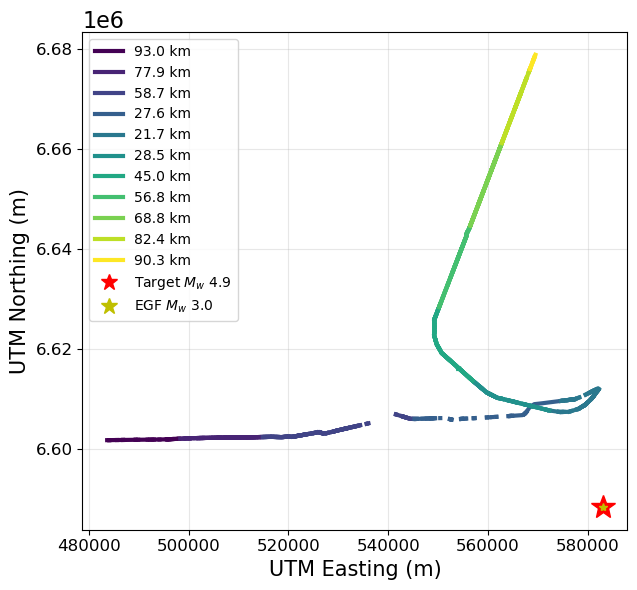

In [56]:
# --- distancias en UTM, mismas longitudes que x_das / y_das ---
event_x, event_y = transformer.transform(event_lon, event_lat)
dist_km_mt = np.hypot(x_das - event_x, y_das - event_y) / 1000.0  # len == x_das.shape[0]

# --- asegurar validez de índices post-drop ---
start = n_drop
n_mt  = x_das.shape[0]
good_orig_idx = np.sort(np.flatnonzero(good_mask))
valid = (good_orig_idx >= start) & (good_orig_idx < start + n_mt)
good_orig_idx = good_orig_idx[valid]
good_idx_mt   = (good_orig_idx - start).astype(int)

# --- agrupado sobre el conjunto bueno ---
n_good = good_idx_mt.size
group_size = 1500
n_groups = int(np.ceil(n_good / group_size))

import matplotlib.cm as cm
cmap = cm.get_cmap('viridis', max(1, n_groups))
group_colors = [cmap(i) for i in range(n_groups)]

fig, ax = plt.subplots(figsize=(8,6))
from matplotlib.lines import Line2D
legend_elems = []

for g in range(n_groups):
    s = g * group_size
    e = min((g + 1) * group_size, n_good)

    idx_mt_grp   = good_idx_mt[s:e]
    idx_orig_grp = good_orig_idx[s:e]

    # cortar en tramos contiguos usando IDs originales
    cuts    = np.where(np.diff(idx_orig_grp) != 1)[0] + 1
    runs_mt = np.split(idx_mt_grp, cuts)

    color = group_colors[g]
    for run in runs_mt:
        if run.size >= 2:
            ax.plot(x_das[run], y_das[run], color=color, linewidth=3)

    # leyenda: ahora dist_km_mt tiene misma longitud que x_das -> no hay OOB
    dmean = float(np.nanmean(dist_km_mt[idx_mt_grp]))
    legend_elems.append(Line2D([0],[0], color=color, lw=3, label=f"{dmean:.1f} km"))

# evento
ax.plot(event_x, event_y, 'r*', ms=18, label='Earthquake')
ax.plot(event_x, event_y, 'y*', ms=6, label='Earthquake')
legend_elems.append(Line2D([0],[0], marker='*', color='r', linestyle='None', ms=12, label='Target $M_w$ 4.9 '))
legend_elems.append(Line2D([0],[0], marker='*', color='y', linestyle='None', ms=12, label='EGF $M_w$ 3.0 '))


ax.legend(handles=legend_elems, loc='best', fontsize=10, frameon=True)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_xlabel('UTM Easting (m)',fontsize=15); ax.set_ylabel('UTM Northing (m)',fontsize=15)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
#ax.set_title('GOOD DAS channels (group-colored) — mean distance in legend')
plt.tight_layout(); 
plt.savefig('mapwcolor-fiber.png',dpi=200)
plt.show()



In [57]:
# here we will calculate the azimuth angle


# Functions
def bearing_deg(lat1, lon1, lat2, lon2):
    """
    Compute azimuth (bearing) from point1 to point2,
    relative to North, in degrees [0,360).
    """
    phi1, phi2 = math.radians(lat1), math.radians(lat2)
    d_lambda = math.radians(lon2 - lon1)
    x = math.sin(d_lambda) * math.cos(phi2)
    y = math.cos(phi1) * math.sin(phi2) - math.sin(phi1) * math.cos(phi2) * math.cos(d_lambda)
    return (math.degrees(math.atan2(x, y)) + 360) % 360

def angle_diff_180(a, b):
    # absolute smallest difference in [0,180]
    d = (a - b) % 360
    d = np.where(d > 180, 360 - d, d)
    return d

# ---- Compute alpha, beta, gamma ----

# α: azimuth epicenter -> channel
df["alpha"] = df.apply(lambda r: bearing_deg(event_lat, event_lon, r["lat"], r["lon"]), axis=1)

# β: fiber azimuth (channel -> neighbor)
# Prefer UTM for geometry-based orientation
# x_m, y_m are UTM Easting/Northing vectors aligned 1:1 with df rows
#dx = np.gradient(x_m.astype(float))
#dy = np.gradient(y_m.astype(float))
# Bearing measured clockwise from North
#beta_deg = (np.degrees(np.arctan2(dx, dy)) + 360) % 360
#df["beta"] = beta_deg

# γ: relative angle between α and β


#df["gamma"] = angle_diff_180(df["alpha"].to_numpy(), df["beta"].to_numpy())

# Keep only the columns of interest
result = df[["channel","lat","lon","alpha"]]

print(result.head())

   channel        lat         lon       alpha
0        0  59.553343 -153.288841  278.969346
1        1  59.553344 -153.288672  278.970149
2        2  59.553346 -153.288502  278.970952
3        3  59.553347 -153.288333  278.971755
4        4  59.553348 -153.288164  278.972558


/tmp/ipykernel_1638565/173662229.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20", len(bins))


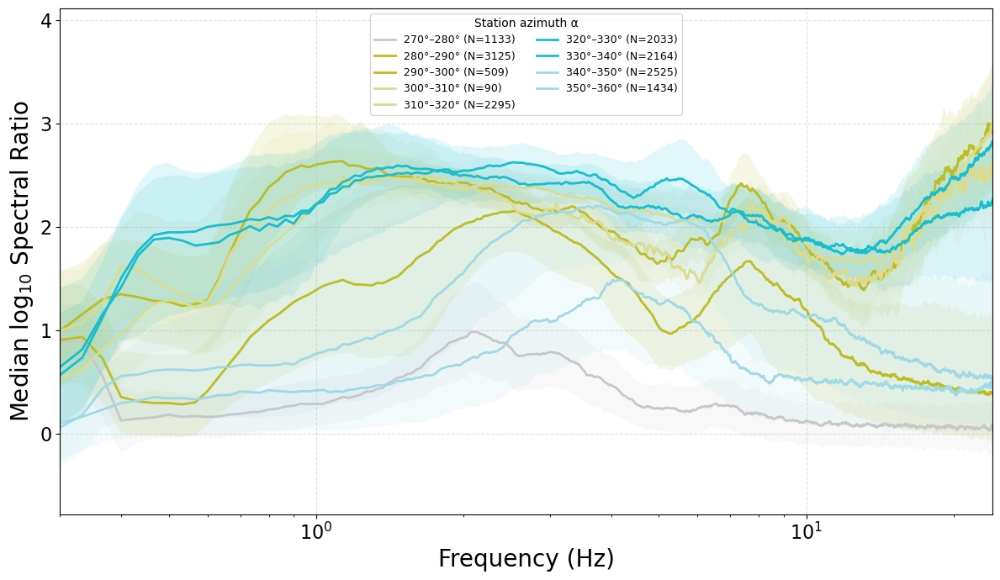

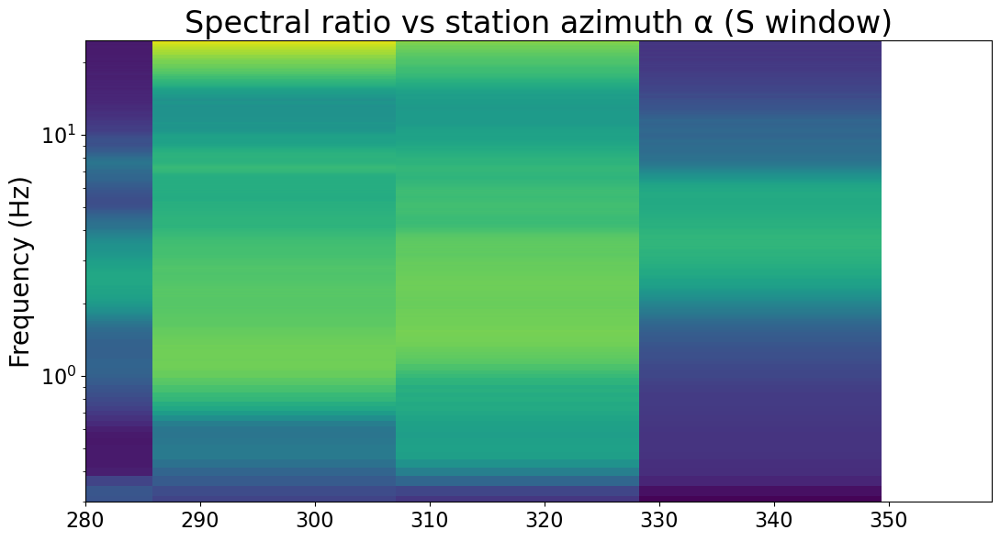

In [74]:
import matplotlib.colors as mcolors
# Assumptions:
# - ratio_pos_g: (n_freq, n_good) spectral ratios from S-window
# - f_pos: (n_freq,) frequency vector
# - idx_good: the *original* integer indices of the channels used in ratio_pos_g
#             (e.g., idx_good = np.flatnonzero(good_mask_full))
# - df["alpha"] is defined for all original channels

df_trimmed = df.iloc[:len(good_mask_mt)].copy()
alpha_g = df_trimmed.loc[good_mask_mt, "alpha"].to_numpy() % 360.0

 # align with ratio_pos_g columns

# --- (A) Curves by azimuth bins ---
bins = np.arange(0, 361, 10)          # 0–20, 20–40, ..., 340–360
bin_ids = np.digitize(alpha_g, bins, right=False)

cmap = cm.get_cmap("tab20", len(bins))


fig, ax = plt.subplots(figsize=(12,7))

for b in range(1, len(bins)):
    sel = (bin_ids == b)
    if not np.any(sel):
        continue
    group = ratio_pos_g[:, sel]
    group = np.where(group > 0, group, np.nan)
    group_log = np.log10(group)
    med = np.nanmedian(group_log, axis=1)
    # optional spread:
    p25 = np.nanpercentile(group_log, 25, axis=1)
    p75 = np.nanpercentile(group_log, 75, axis=1)

    ax.plot(f_pos, med, color=cmap(b), lw=2,
            label=f"{bins[b-1]:.0f}°–{bins[b]:.0f}° (N={sel.sum()})")
    ax.fill_between(f_pos, p25, p75, color=cmap(b), alpha=0.12, linewidth=0)

ax.set_xscale("log")
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Median log$_{10}$ Spectral Ratio")
ax.set_xlim(0.3,24)
ax.grid(True, ls="--", alpha=0.4)
ax.legend(title="Station azimuth α", ncol=2, fontsize=9)
plt.tight_layout(); plt.show()

# --- (B) Heatmap: frequency vs α ---
n_bins = 17
abins = np.linspace(0, 360, n_bins+1)
aid = np.digitize(alpha_g, abins)
heat = np.full((len(f_pos), n_bins), np.nan)

for b in range(1, n_bins+1):
    sel = (aid == b)
    if np.any(sel):
        g = ratio_pos_g[:, sel]
        g = np.where(g > 0, g, np.nan)
        heat[:, b-1] = np.nanmedian(np.log10(g), axis=1)

plt.figure(figsize=(11,6))
plt.pcolormesh(abins[:-1], f_pos, heat, shading="auto", cmap="viridis")
plt.yscale("log")
plt.ylim(0.3,24.5)
plt.xlim(280,359)
plt.ylabel("Station azimuth α (deg)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectral ratio vs station azimuth α (S window)")
plt.tight_layout(); plt.show()


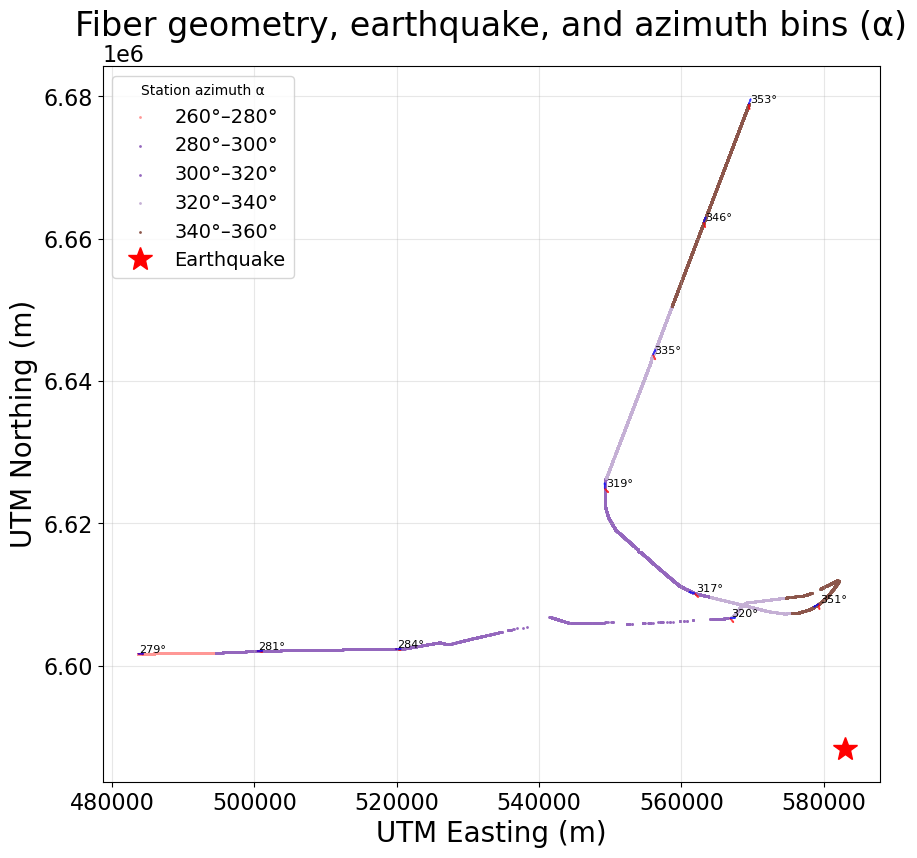

In [75]:
# Subset the coordinates
x_good = x_das[good_mask_mt[:len(x_das)]]
y_good = y_das[good_mask_mt[:len(y_das)]]
# --- Define α bins (same as in your spectral ratio plot) ---
bins = np.arange(0, 361, 20)   # 0–20, 20–40, ..., 340–360
bin_ids = np.digitize(alpha_g, bins)

fig, ax = plt.subplots(figsize=(9,9))

# --- Plot fiber by α bin ---
for b in range(1, len(bins)):
    sel = (bin_ids == b)
    if not np.any(sel):
        continue
    ax.scatter(x_good[sel], y_good[sel],
               color=cmap(b), s=4, lw=0,
               label=f"{bins[b-1]}°–{bins[b]}°")

# --- Earthquake ---
ax.plot(event_x, event_y, "r*", markersize=18, label="Earthquake")

# --- Representative arrows ---
n_points = 10
idx_sel = np.linspace(0, len(x_good)-1, n_points, dtype=int)

for i in idx_sel:
    x0, y0 = x_good[i], y_good[i]

    # Vector toward the earthquake
    qvec = np.array([event_x - x0, event_y - y0])
    qvec = qvec / np.linalg.norm(qvec)

    # Fiber tangent
    if i < len(x_good)-1:
        fvec = np.array([x_good[i+1] - x0, y_good[i+1] - y0])
    else:
        fvec = np.array([x0 - x_good[i-1], y0 - y_good[i-1]])
    fvec = fvec / np.linalg.norm(fvec)

    scale = 800
    ax.arrow(x0, y0, qvec[0]*scale, qvec[1]*scale,
             head_width=150, color="red", alpha=0.7, length_includes_head=True)
    ax.arrow(x0, y0, fvec[0]*scale, fvec[1]*scale,
             head_width=150, color="blue", alpha=0.7, length_includes_head=True)

    # Annotate α
    ax.text(x0+200, y0+200, f"{alpha_g[i]:.0f}°", fontsize=8, color="k")

# --- Formatting ---
ax.set_aspect("equal")
ax.set_xlabel("UTM Easting (m)")
ax.set_ylabel("UTM Northing (m)")
ax.grid(True, alpha=0.3)
ax.legend(title="Station azimuth α")
plt.title("Fiber geometry, earthquake, and azimuth bins (α)")
plt.tight_layout()
plt.show()

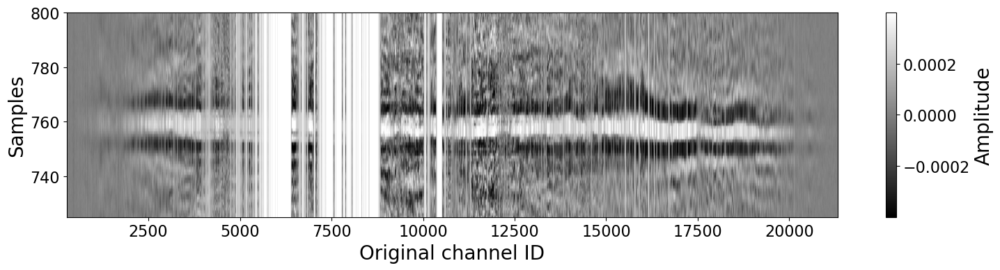

In [61]:
# Inputs assumed:
# stf_matrix: (n_samples, n_mt)   # post-drop (after n_drop)
# good_mask_mt: (n_mt,) booleans  # good channels aligned to stf_matrix columns
# n_drop: number of channels removed on the left before MT
stf_data = np.real(stf_g)
A = np.nanpercentile(np.abs(stf_data), 99)   # try 98–99.9 depending on outliers
vmin, vmax = -A, A
n_samp, n_mt = stf_matrix.shape
start = n_drop                        # first original channel ID present post-drop

# 1) sparse image with NaNs where channels are not "good"
stf_sparse = np.full((n_samp, n_mt), np.nan, dtype=float)
good_idx_mt = np.flatnonzero(good_mask_mt)
stf_sparse[:, good_idx_mt] = np.real(stf_matrix[:, good_idx_mt])

# 2) plot with x-axis in ORIGINAL channel IDs (showing gaps)
cmap = plt.get_cmap('gray').copy()
#cmap.set_bad('white')                 # NaNs appear white (the gaps)

fig, ax = plt.subplots(figsize=(15,4))
im = ax.imshow(
    stf_sparse, aspect='auto', cmap=cmap,
    vmin=vmin, vmax=vmax,
    extent=[start - 0.5, start + n_mt - 0.5, n_samp - 1, 0]  # x = original IDs
)
fig.colorbar(im, ax=ax, label='Amplitude')
ax.set_xlabel('Original channel ID')
ax.set_ylabel('Samples')
ax.set_ylim(725,800)
# ax.set_xlim(… )  # optionally zoom in original-ID space, e.g., (3000, 9000)
plt.tight_layout(); plt.show()
